In [21]:
import torch

from lucent.optvis import render, param, transform, objectives
from lucent.modelzoo import inceptionv1

In [22]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = inceptionv1(pretrained=True)
_ = model.to(device).eval()

In [23]:
@objectives.wrap_objective()
def class_wise(class_number, batch=None):
    
    # @objectives.handle_batch(batch)
    def inner(T):
        
        layer_t = T("softmax2")
        # print(layer_t.shape)
        layer_t = layer_t[:, class_number]
        return - layer_t.mean()
        
    return inner


Initial loss: -0.000


  0%|          | 0/4096 [00:00<?, ?it/s]

 12%|█▏        | 509/4096 [00:17<02:06, 28.40it/s]

Interrupted optimization at step 510.
Loss at step 510: -0.250



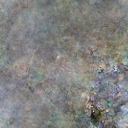
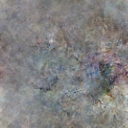
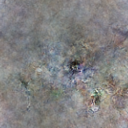
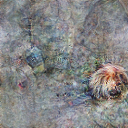

In [24]:
batch_param_f = lambda: param.image(128, batch=4)

obj = class_wise(56, batch=4) #- 1e2 * objectives.diversity("mixed5a")

_ = render.render_vis(model, obj, batch_param_f, show_inline=True, verbose=True, thresholds=(512, 1024, 2048, 4096))

 19%|█▉        | 96/512 [00:02<00:09, 45.02it/s]

100%|██████████| 512/512 [00:11<00:00, 43.97it/s]



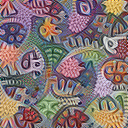
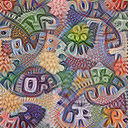
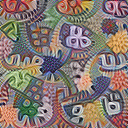
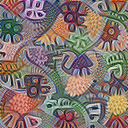

In [ ]:
batch_param_f = lambda: param.image(128, batch=4)

obj = objectives.channel("mixed4a", 476) #- 1e2 * objectives.diversity("mixed5a")

imgs = render.render_vis(model, obj, batch_param_f, show_inline=True)

  1%|▏         | 7/512 [00:00<00:15, 31.57it/s]

100%|██████████| 512/512 [00:12<00:00, 41.63it/s]



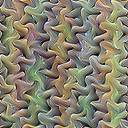
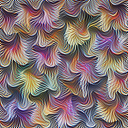
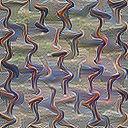
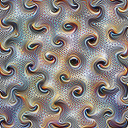

In [ ]:
# Different curvy facets

obj = objectives.channel("mixed4a", 97) - 1e3 * objectives.diversity("mixed4a") # here we use a higher weight on the diversity term

_ = render.render_vis(model, obj, batch_param_f, show_inline=True)

  3%|▎         | 14/512 [00:00<00:11, 41.74it/s]

100%|██████████| 512/512 [00:12<00:00, 41.78it/s]



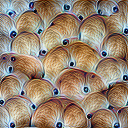
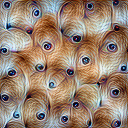
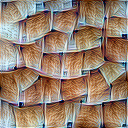
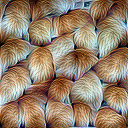

In [ ]:
# Different shapes with the same fur texture

obj = objectives.channel("mixed4a", 143) - 1e2 * objectives.diversity("mixed4a")

_ = render.render_vis(model, obj, batch_param_f, show_inline=True)

  1%|▏         | 7/512 [00:00<00:16, 30.17it/s]

100%|██████████| 512/512 [00:16<00:00, 31.01it/s]



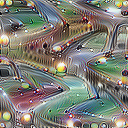
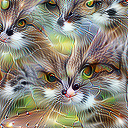
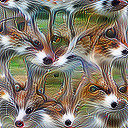
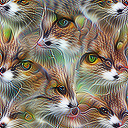

In [ ]:
# Cars and Cats

obj = objectives.channel("mixed4e", 55) - 1e2 * objectives.diversity("mixed4e")

_ = render.render_vis(model, obj, batch_param_f, show_inline=True)

  2%|▏         | 12/512 [00:00<00:13, 35.99it/s]

100%|██████████| 512/512 [00:14<00:00, 36.00it/s]



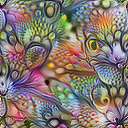
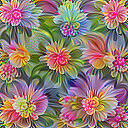
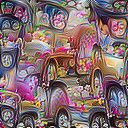
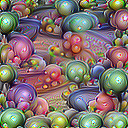

In [ ]:
# Flowers and err... other stuff?

batch_param_f = lambda: param.image(128, batch=4, decorrelate=False) # disable channel decorrelation for more trippy images

obj = objectives.channel("mixed4d_3x3_bottleneck_pre_relu_conv", 139) - 1e3 * objectives.diversity("mixed4d_3x3_bottleneck_pre_relu_conv")

_ = render.render_vis(model, obj, batch_param_f, show_inline=True)

In [ ]:
# General support
import math
import torch
import numpy as np

# For plots
import matplotlib.pyplot as plt

# Dimensionality reduction
import umap
from sklearn.manifold import TSNE

# General lucid code
from lucent.misc.io import show
import lucent.modelzoo as models

# For rendering feature visualizations
import lucent.optvis.objectives as objectives
import lucent.optvis.param as param
import lucent.optvis.render as render
import lucent.optvis.transform as transform

In [2]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = models.inceptionv1(pretrained=True)
model = model.to(device)
_ = model.eval()


In [3]:
class TeacherStudentModel(torch.nn.Module):
    def __init__(self, teacher, student):
        super(TeacherStudentModel, self).__init__()
        self.teacher = teacher
        self.student = student
        self.final_loss = torch.nn.MSELoss()
    def forward(self, x):
        x_new = x*255 - 117
        teacher_output = self.teacher(x_new)
        student_output = self.student(x_new)
        loss = self.final_loss(teacher_output, student_output)
        return loss

class TeacherStudentDiscModel(torch.nn.Module):
    def __init__(self, teacher, student, disc):
        super(TeacherStudentDiscModel, self).__init__()
        self.teacher = teacher
        self.student = student
        self.disc = disc
        self.shap_loss = torch.nn.MSELoss()
        self.final_loss = torch.nn.MSELoss()
    def forward(self, x):
        x_new = x*255 - 117
        # x_new = x
        teacher_output = self.teacher(x_new)
        student_output = self.student(x_new)
        with torch.no_grad():
            z_v = torch.zeros_like(x)
            y_idx = teacher_output.argmax(-1)
        disc_output, disc_sigma = self.disc(x, y_idx)
        shap_obj = self.shap_loss(disc_output, z_v)
        loss = self.final_loss(teacher_output, student_output) + shap_obj
        return loss

In [4]:
from copy import deepcopy
import torch

model_pert = deepcopy(model)

sd = 0.02

for model_param in model_pert.parameters():
    with torch.no_grad():
        pert = sd * ((2*torch.rand_like(model_param)) - 1 )
        model_param.add_(pert)

_ = model_pert.eval()

In [5]:
from vidmodex.generator import ShapDiscriminator2D

disc = ShapDiscriminator2D(3, 1, 1001)
stdict = torch.load("checkpoint_disc.ckpt")
disc.load_state_dict(stdict)
disc = disc.to("cuda:0")

In [6]:
dual_disc_model = TeacherStudentDiscModel(model, model_pert, disc)

In [7]:
@torch.no_grad()
def get_layer(model, layer, X):
    hook = render.ModuleHook(getattr(model, layer))
    model(X)
    hook.close()
    return hook.features


@objectives.wrap_objective()
def dot_compare(layer, acts, batch=1):
    def inner(T):
        pred = T(layer)[batch]
        return -(pred * acts).sum(dim=0, keepdims=True).mean()

    return inner

In [8]:
from lucent.optvis import objectives
@objectives.wrap_objective()
def class_wise(class_number, batch=None):
    
    # @objectives.handle_batch(batch)
    def inner(T):
        
        layer_t = T("softmax2")
        # print(layer_t.shape)
        layer_t = layer_t[:, class_number]
        return - layer_t.mean()
        
    return inner

In [9]:
@objectives.wrap_objective()
def dual_class_wise(class_number, batch=None):
    
    # @objectives.handle_batch(batch)
    def inner(T):
        
        layer_t1 = T("teacher_softmax2")
        # print(layer_t.shape)
        layer_t1 = layer_t1[:, class_number]
        layer_t2 = T("student_softmax2")
        # print(layer_t.shape)
        layer_t2 = layer_t2[:, class_number]
        return (- layer_t1 - layer_t2)[batch, ...].mean()
        
    return inner

In [10]:
@objectives.wrap_objective()
def vanilla_gen(batch=None):
    # @objectives.handle_batch(batch)
    def inner(T):
        output = T("final_loss")
        # print(output.shape)
        return - output.mean()
    return inner

In [11]:
@objectives.wrap_objective()
def shap_obj_gen(batch=None):
    # @objectives.handle_batch(batch)
    def inner(T):
        output = T("shap_loss")
        # print(output.shape)
        return - output.mean()
    return inner

In [12]:
PATH_TEMPLATE = "../aligned-activations-and-attributions/dataset=ImageNet-train/model={}/layer={}/{}-{:05d}-of-{:05d}.npy"

PAGE_SIZE = 16384 #10000
NUMBER_OF_AVAILABLE_SAMPLES = 1048576 #100000

assert NUMBER_OF_AVAILABLE_SAMPLES % PAGE_SIZE == 0

NUMBER_OF_PAGES = NUMBER_OF_AVAILABLE_SAMPLES // PAGE_SIZE

def sanitize(string):
    return string.replace("/", "_")

def get_aligned_data(data_type, layer_name, layer_model_name) -> np.ndarray:
    """Downloads 100k activations of the specified layer sampled from iterating over
    ImageNet. Activations of all layers where sampled at the same spatial positions for
    each image, allowing the calculation of correlations."""
    activation_paths = [
        PATH_TEMPLATE.format(
            sanitize(layer_model_name), sanitize(layer_name), data_type, page, NUMBER_OF_PAGES
        )
        for page in range(NUMBER_OF_PAGES)
    ]
    activations = np.vstack([np.load(path) for path in activation_paths])
    assert np.all(np.isfinite(activations))
    return activations

In [13]:
from sklearn.model_selection import train_test_split
from scipy.special import softmax

split_ratio = 0.1


layer = "mixed4b" # "mixed4c" #_pool_reduce_pre_relu_conv"
raw_activations = get_aligned_data("activations","mixed4b", "InceptionV1")
og_attributions = get_aligned_data("attributions","mixed4b", "InceptionV1")
_, activations, _, attributions = train_test_split(raw_activations, og_attributions, test_size=split_ratio, random_state=53, shuffle=True) #, stratify=og_attributions.argmax(-1))
# _, activations, _, attributions = train_test_split(activations, attributions, test_size=split_ratio, random_state=7, shuffle=True, stratify=attributions.argmax(-1))

# activations = raw_activations[:100000]
if "softmax" in layer:
    activations, attributions = softmax(activations, -1), softmax(attributions, -1)
print(activations.shape, attributions.shape)

(104858, 512) (104858, 1008)


In [14]:
def whiten(full_activations):
    correl = np.matmul(full_activations.T, full_activations) / len(full_activations)
    correl = correl.astype("float32")
    S = np.linalg.inv(correl)
    S = S.astype("float32")
    return S

In [15]:
S = whiten(activations)

In [16]:
def normalize_layout(layout, min_percentile=1, max_percentile=99, relative_margin=0.1):
    """Removes outliers and scales layout to between [0,1]."""

    # compute percentiles
    mins = np.percentile(layout, min_percentile, axis=(0))
    maxs = np.percentile(layout, max_percentile, axis=(0))

    # add margins
    mins -= relative_margin * (maxs - mins)
    maxs += relative_margin * (maxs - mins)

    # `clip` broadcasts, `[None]`s added only for readability
    clipped = np.clip(layout, mins, maxs)

    # embed within [0,1] along both axes
    clipped -= clipped.min(axis=0)
    clipped /= clipped.max(axis=0)

    return clipped

In [17]:
layout = umap.UMAP(n_components=2, verbose=True, n_neighbors=20, min_dist=0.01, metric="cosine").fit_transform(activations)

## You can optionally use TSNE as well
# layout = TSNE(n_components=2, verbose=True, metric="cosine", learning_rate=10, perplexity=50).fit_transform(d)

layout = normalize_layout(layout)

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.01, n_neighbors=20, verbose=True)
Tue Jul 30 12:46:59 2024 Construct fuzzy simplicial set


Tue Jul 30 12:47:00 2024 Finding Nearest Neighbors
Tue Jul 30 12:47:00 2024 Building RP forest with 21 trees
Tue Jul 30 12:47:06 2024 NN descent for 17 iterations
	 1  /  17
	 2  /  17
	 3  /  17
	 4  /  17
	 5  /  17
	 6  /  17
	Stopping threshold met -- exiting after 6 iterations
Tue Jul 30 12:47:29 2024 Finished Nearest Neighbor Search
Tue Jul 30 12:47:32 2024 Construct embedding


Epochs completed:   2%| ▏          3/200 [00:03]

	completed  0  /  200 epochs


Epochs completed:  11%| █          22/200 [00:05]

	completed  20  /  200 epochs


Epochs completed:  21%| ██         42/200 [00:09]

	completed  40  /  200 epochs


Epochs completed:  31%| ███        62/200 [00:12]

	completed  60  /  200 epochs


Epochs completed:  41%| ████       82/200 [00:15]

	completed  80  /  200 epochs


Epochs completed:  51%| █████      102/200 [00:18]

	completed  100  /  200 epochs


Epochs completed:  61%| ██████     122/200 [00:21]

	completed  120  /  200 epochs


Epochs completed:  71%| ███████    142/200 [00:25]

	completed  140  /  200 epochs


Epochs completed:  81%| ████████   162/200 [00:28]

	completed  160  /  200 epochs


Epochs completed:  91%| █████████  182/200 [00:31]

	completed  180  /  200 epochs


Epochs completed: 100%| ██████████ 200/200 [00:34]


Tue Jul 30 12:48:13 2024 Finished embedding


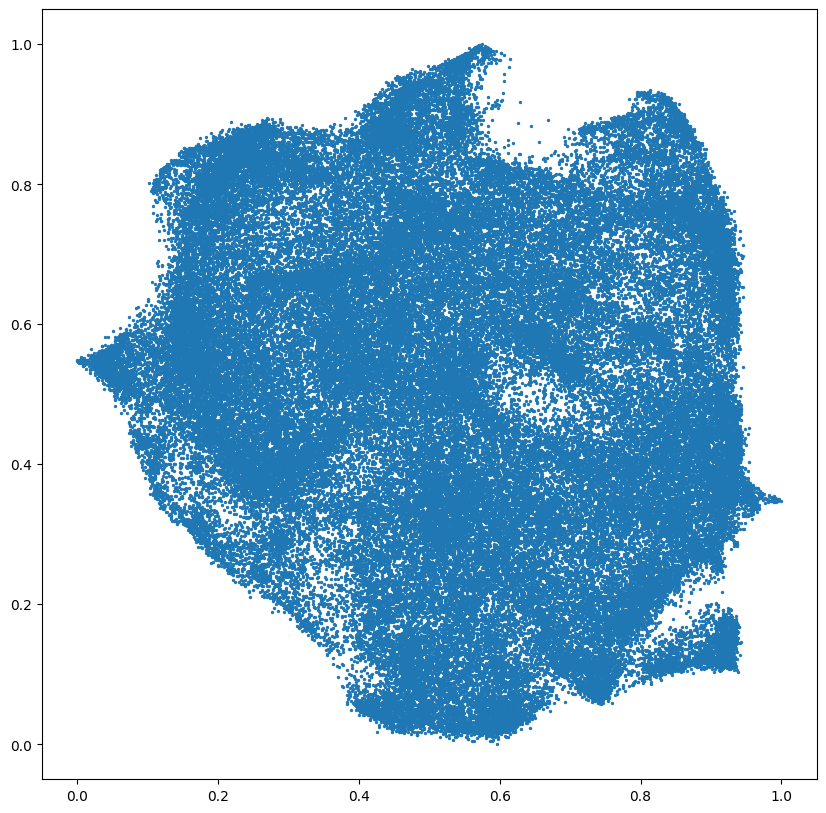

In [20]:
plt.figure(figsize=(10, 10))
plt.scatter(x=layout[:,0],y=layout[:,1], s=2)
plt.show()


In [21]:
# 
# Whitened, euclidean neuron objective
# 
from lucent.optvis.objectives_util import _extract_act_pos
from lucent.optvis.objectives import handle_batch

@objectives.wrap_objective()
def direction_neuron_S(layer_name, vec, batch=None, x=None, y=None, S=None):
    @handle_batch(batch)
    def inner(T):
        
        layer_t = T(layer_name)

        acts = _extract_act_pos(layer_t, x, y)
        vec_ = vec

        if S is not None: vec_ = (vec_[None] @ S)[0]
        # mag = tf.sqrt(tf.reduce_sum(acts**2))
        dot = (acts * torch.tensor(vec_, dtype=acts.dtype, device=acts.device)).mean()
        # cossim = dot/(1e-4 + mag)
        return - dot
    return inner

# 
# Whitened, cosine similarity objective
# 
@objectives.wrap_objective()
def direction_neuron_cossim_S(layer_name, vec, batch=None, x=None, y=None, cossim_pow=1, S=None):
    
    @handle_batch(batch)
    def inner(T):
        
        layer_t = T(layer_name)
        layer_t = _extract_act_pos(layer_t, x, y)
        vec_ = vec
        
        if S is not None: vec_ = (vec_[None] @ S)[0]
        
        vec_t = torch.tensor(vec_, dtype=layer_t.dtype, device=layer_t.device)
        # print(vec_t.shape, layer_t.shape)
        return -torch.nn.CosineSimilarity(dim=1, eps=1e-4)(vec_t.reshape(
            (1, -1, 1, 1)), layer_t).mean()
        # mag = torch.sqrt((acts**2).sum())
        # # print(acts.shape, vec_.shape)
        # dot = (acts * torch.tensor(vec_, dtype=acts.dtype, device=acts.device)).mean()
        # cossim = dot/(1e-4 + mag)
        # cossim = torch.clip(cossim, max=0.1)
        # return - dot * cossim ** cossim_pow
    return inner

#
# Renders a batch of activations as icons
#
def render_icons(directions, model, layer, size=80, n_steps=128, verbose=False, S=None, num_attempts=2, cossim=True, alpha=True, shap_based=False, cls_idx=None):
    image_attempts = []
    loss_attempts = []

    # Render multiple attempts, and pull the one with the lowest loss score.
    for attempt in range(num_attempts):

      # Render an image for each activation vector
      param_f = lambda: param.image(size, batch=directions.shape[0], fft=True, decorrelate=True)
      if cls_idx is not None:
        obj_list = ([
          3*dual_class_wise(cls_id, batch=i) for i,cls_id in enumerate(cls_idx)
        ])
      else:
        if(S is not None):
            if(cossim is True):
                obj_list = ([
                  direction_neuron_cossim_S(layer, v, batch=n, S=S, cossim_pow=4) for n,v in enumerate(directions)
                ]) 
            else: 
                obj_list = ([
                  direction_neuron_S(layer, v, batch=n, S=S) for n,v in enumerate(directions)
                ])    
        else: 
            obj_list = ([
              objectives.direction_neuron(layer, v, batch=n) for n,v in enumerate(directions)
            ])
      if not shap_based:
          obj_list.append(
            1.4*vanilla_gen()
          )
      else:
          obj_list.extend([
            0.6*vanilla_gen(),
            2.4*shap_obj_gen()
          ])
      obj = objectives.Objective.sum(obj_list)
      # obj = objectives.channel("mixed4d_3x3_bottleneck_pre_relu_conv", 139)
      transforms = []
    
      transforms.append(transform.pad(2, mode='constant', constant_value=1))
      transforms.append(transform.jitter(4))
      transforms.append(transform.jitter(4))
      transforms.append(transform.jitter(8))
      transforms.append(transform.jitter(8))
      transforms.append(transform.jitter(8))
      transforms.append(transform.random_scale([0.995**n for n in range(-5,80)] + [0.998**n for n in 2*list(range(20,40))]))
      transforms.append(transform.random_rotate(list(range(-20,20))+list(range(-10,10))+list(range(-5,5))+5*[0]))
      transforms.append(transform.jitter(2))

      # This is the tensorflow optimization process.
      # We can't use the lucid helpers here because we need to know the loss.

      print("attempt: ", attempt)
      img = render.render_vis(model, obj, param_f, thresholds=(n_steps,), transforms=transforms, show_image=False, verbose=True)
      image_attempts.append(np.array(img))
    #   learning_rate = 0.05
    #   losses = []
    #   trainer = tf.train.AdamOptimizer(learning_rate)
    #   T = render.make_vis_T(model, obj, param_f, trainer, transforms)
    #   loss_t, vis_op, t_image = T("loss"), T("vis_op"), T("input")
    #   losses_ = [obj_part(T) for obj_part in obj_list]
    #   tf.global_variables_initializer().run()
    #   for i in range(n_steps):
    #       loss, _ = sess.run([losses_, vis_op])
    #       losses.append(loss)
    #       if (i % 100 == 0):
    #           print(i)
  
    #   img = t_image.eval()
    #   img_rgb = img[:,:,:,:3]
    #   if alpha:
    #       print("alpha true")
    #       k = 0.8
    #       bg_color = 0.0
    #       img_a = img[:,:,:,3:]
    #       img_merged = img_rgb*((1-k)+k*img_a) + bg_color * k*(1-img_a)
    #       image_attempts.append(img_merged)
    #   else:
    #       print("alpha false")
    #       image_attempts.append(img_rgb)
  
    #   loss_attempts.append(losses[-1])

    # Use the icon with the lowest loss
    # loss_attempts = np.asarray(loss_attempts)   
    loss_final = []
    image_final = []
    try:
      print("Merging best scores from attempts...")
      for i, d in enumerate(directions):
          # note, this should be max, it is not a traditional loss
          # mi = np.argmax(loss_attempts[:,i])
          image_final.append(image_attempts[i])
    except:
        image_final = image_attempts

    return (image_final, loss_final)
  
  


In [22]:
from scipy.ndimage import zoom
import cv2

def border_resize(img, ratio):
    og_shape = img.shape
    new_shape = og_shape / np.sqrt(ratio)
    new_shape = [int(n) for n in new_shape]
    new_shape[2] = 3
    blank = np.ones(new_shape)
    off_ratio = ((1./np.sqrt(ratio)) - 1.) / 2.
    offx, offy = int(off_ratio*og_shape[0]), int(off_ratio*og_shape[1])
    
    offx_end, offy_end = offx+og_shape[0] , offy+og_shape[1]
    blank[ offx:offx_end, offy:offy_end, : ] = img
    final = cv2.resize((255*blank).astype(np.uint8), og_shape[:2]).astype(np.float32)/255.
    # final = np.stack([zoom(blank[:,:,c], np.sqrt(ratio), order=0) for c in range(3)], axis=-1)

    return final


In [23]:
# 
# Takes a list of x,y layout and bins them into grid cells
# 
def grid(xpts=None, ypts=None, grid_size=(8,8), x_extent=(0., 1.), y_extent=(0., 1.)):
    xpx_length = grid_size[0]
    ypx_length = grid_size[1]

    xpt_extent = x_extent
    ypt_extent = y_extent

    xpt_length = xpt_extent[1] - xpt_extent[0]
    ypt_length = ypt_extent[1] - ypt_extent[0]

    xpxs = ((xpts - xpt_extent[0]) / xpt_length) * xpx_length
    ypxs = ((ypts - ypt_extent[0]) / ypt_length) * ypx_length

    ix_s = range(grid_size[0])
    iy_s = range(grid_size[1])
    xs = []
    for xi in ix_s:
        ys = []
        for yi in iy_s:
            xpx_extent = (xi, (xi + 1))
            ypx_extent = (yi, (yi + 1))

            in_bounds_x = np.logical_and(xpx_extent[0] <= xpxs, xpxs <= xpx_extent[1])
            in_bounds_y = np.logical_and(ypx_extent[0] <= ypxs, ypxs <= ypx_extent[1])
            in_bounds = np.logical_and(in_bounds_x, in_bounds_y)

            in_bounds_indices = np.nonzero(in_bounds)[0]
            ys.append(in_bounds_indices)
            # print(ys[-1])
        xs.append(ys)
    return xs


In [24]:
import gc

def render_layout(model, layer, S, xs, ys, activ, cls_idx, n_steps=512, n_attempts=2, min_density=10, grid_size=(10, 10), icon_size=80, x_extent=(0., 1.0), y_extent=(0., 1.0), max_density=100, shap_based=False):
    grid_layout = grid(xpts=xs, ypts=ys, grid_size=grid_size, x_extent=x_extent, y_extent=y_extent)
    icons = []

    for x in range(grid_size[0]):
        for y in range(grid_size[1]):
            indices = grid_layout[x][y]
            if len(indices) > min_density:
                average_activation = np.average(activ[indices], axis=0)
                all_cls = cls_idx[indices]
                vals,counts = np.unique(all_cls, return_counts=True) 
                mode_cls = vals[np.argmax(counts)]
                indx_freqs = len(indices)
                icons.append([average_activation, x, y, indx_freqs, mode_cls])
    icons_img = np.asarray([i[0] for i in icons])
    icons_cls = np.asarray([i[4] for i in icons])
    print(len(icons_img))
    splits = 8
    N = len(icons_img)
    
    split_size = N//splits
    icon_batches = []
    for i in range(splits+1):
        if split_size*i >= N:
            continue
        sub_icons_img = icons_img[split_size*(i): min(N,split_size*(i+1))]
        mode_cls = icons_cls[split_size*(i): min(N,split_size*(i+1))]
        icon_batch, _ = render_icons(sub_icons_img, model, alpha=False, layer=layer, S=S, n_steps=n_steps, size=icon_size, num_attempts=n_attempts, shap_based=shap_based, cls_idx=mode_cls)
        # print(icon_batch)
        icon_batches.append(icon_batch[0][0])
        torch.cuda.empty_cache()
        gc.collect()
    icon_batch = np.concatenate(icon_batches, axis=0)
    print(icon_batch.shape)
    # icon_batch = icon_batch[0][0]
    
    print(icon_batch.shape)
    for i in range(len(icons)):
        icons[i][3] = min(max_density, icons[i][3])
    max_density = max([ic[3] for ic in icons])
    print([ic[3] for ic in icons])
    for i in range(len(icons)):
        icons[i][3] = max(0.05, (icons[i][3] - min_density)/ ( max_density - min_density))
        resized_img = border_resize(icon_batch[i], icons[i][3]**.8)
        offx, offy = 0,0
        offx_end, offy_end = resized_img.shape[:2]
        icon_batch[i] = 1.
        icon_batch[i, offx:offx_end, offy:offy_end, :] = resized_img
    canvas = np.ones((icon_size * grid_size[0], icon_size * grid_size[1], 3))
    for i, icon in enumerate(icon_batch):
        y = int(icons[i][1])
        x = int(icons[i][2])
        offx = (grid_size[0] - x - 1) * icon_size
        offy = (y) * icon_size
        offx_end = offx + icon.shape[0]
        offy_end = offy + icon.shape[1]
        canvas[offx:offx_end, offy:offy_end] = icon

    return canvas, icon_batch, icons_cls

In [25]:
# 
# Given a layout, renders an icon for the average of all the activations in each grid cell.
# 

xs = layout[:, 0]

ys = layout[:, 1]
canvas,  n , icon_cls = render_layout(dual_disc_model, "teacher_"+layer, S, xs, ys, activations, attributions.argmax(-1), n_steps=512, grid_size=(30, 30), n_attempts=1,min_density=15, max_density=250, shap_based=False)


625
attempt:  0
Initial loss: -0.139


  2%|▏         | 10/512 [00:03<02:31,  3.32it/s]

100%|██████████| 512/512 [02:30<00:00,  3.40it/s]

Loss at step 512: -120.002
Merging best scores from attempts...


attempt:  0
Initial loss: -0.011


100%|██████████| 512/512 [02:31<00:00,  3.39it/s]

Loss at step 512: -132.002
Merging best scores from attempts...


attempt:  0
Initial loss: -0.000


100%|██████████| 512/512 [02:30<00:00,  3.40it/s]

Loss at step 512: -79.878
Merging best scores from attempts...


attempt:  0
Initial loss: -0.003


100%|██████████| 512/512 [02:31<00:00,  3.38it/s]

Loss at step 512: -138.001
Merging best scores from attempts...


attempt:  0
Initial loss: -0.003


100%|██████████| 512/512 [02:31<00:00,  3.39it/s]

Loss at step 512: -149.993
Merging best scores from attempts...


attempt:  0
Initial loss: -0.001


100%|██████████| 512/512 [02:31<00:00,  3.38it/s]

Loss at step 512: -183.002
Merging best scores from attempts...


attempt:  0
Initial loss: -0.003


100%|██████████| 512/512 [02:31<00:00,  3.39it/s]

Loss at step 512: -197.976
Merging best scores from attempts...


attempt:  0
Initial loss: -0.002


100%|██████████| 512/512 [02:31<00:00,  3.37it/s]

Loss at step 512: -222.001
Merging best scores from attempts...


attempt:  0
Initial loss: -0.003


100%|██████████| 512/512 [00:41<00:00, 12.48it/s]


Loss at step 512: -0.003
Merging best scores from attempts...
(625, 80, 80, 3)
(625, 80, 80, 3)
[19, 189, 18, 250, 250, 66, 77, 82, 85, 201, 152, 118, 24, 99, 91, 137, 103, 121, 154, 183, 143, 81, 48, 19, 24, 73, 86, 102, 59, 56, 52, 114, 193, 250, 250, 250, 250, 202, 185, 137, 147, 104, 104, 65, 156, 145, 65, 93, 147, 250, 235, 250, 250, 250, 232, 183, 162, 190, 249, 250, 250, 186, 79, 110, 40, 71, 187, 250, 203, 165, 233, 234, 190, 200, 132, 126, 119, 184, 219, 250, 250, 58, 29, 137, 103, 66, 170, 250, 231, 182, 189, 186, 192, 153, 154, 212, 144, 104, 108, 150, 250, 250, 173, 16, 86, 107, 187, 105, 198, 250, 249, 208, 183, 199, 137, 116, 137, 250, 153, 108, 95, 118, 243, 250, 123, 21, 98, 72, 73, 66, 108, 139, 250, 250, 177, 127, 110, 127, 139, 145, 244, 222, 119, 80, 107, 234, 169, 48, 62, 48, 48, 43, 54, 71, 98, 157, 241, 208, 128, 177, 203, 225, 157, 250, 225, 123, 115, 97, 175, 113, 43, 33, 38, 20, 58, 51, 61, 94, 118, 95, 115, 83, 89, 214, 134, 250, 250, 250, 250, 216, 241, 123,

In [26]:
print(torch.cuda.memory_summary())

|===========================================================================|
|                  PyTorch CUDA memory summary, device ID 0                 |
|---------------------------------------------------------------------------|
|            CUDA OOMs: 0            |        cudaMalloc retries: 0         |
|===========================================================================|
|        Metric         | Cur Usage  | Peak Usage | Tot Alloc  | Tot Freed  |
|---------------------------------------------------------------------------|
| Allocated memory      | 163259 KiB |  42292 MiB | 350935 GiB | 350935 GiB |
|       from large pool | 104696 KiB |  42217 MiB | 349755 GiB | 349755 GiB |
|       from small pool |  58563 KiB |    231 MiB |   1180 GiB |   1180 GiB |
|---------------------------------------------------------------------------|
| Active memory         | 163259 KiB |  42292 MiB | 350935 GiB | 350935 GiB |
|       from large pool | 104696 KiB |  42217 MiB | 349755 GiB |

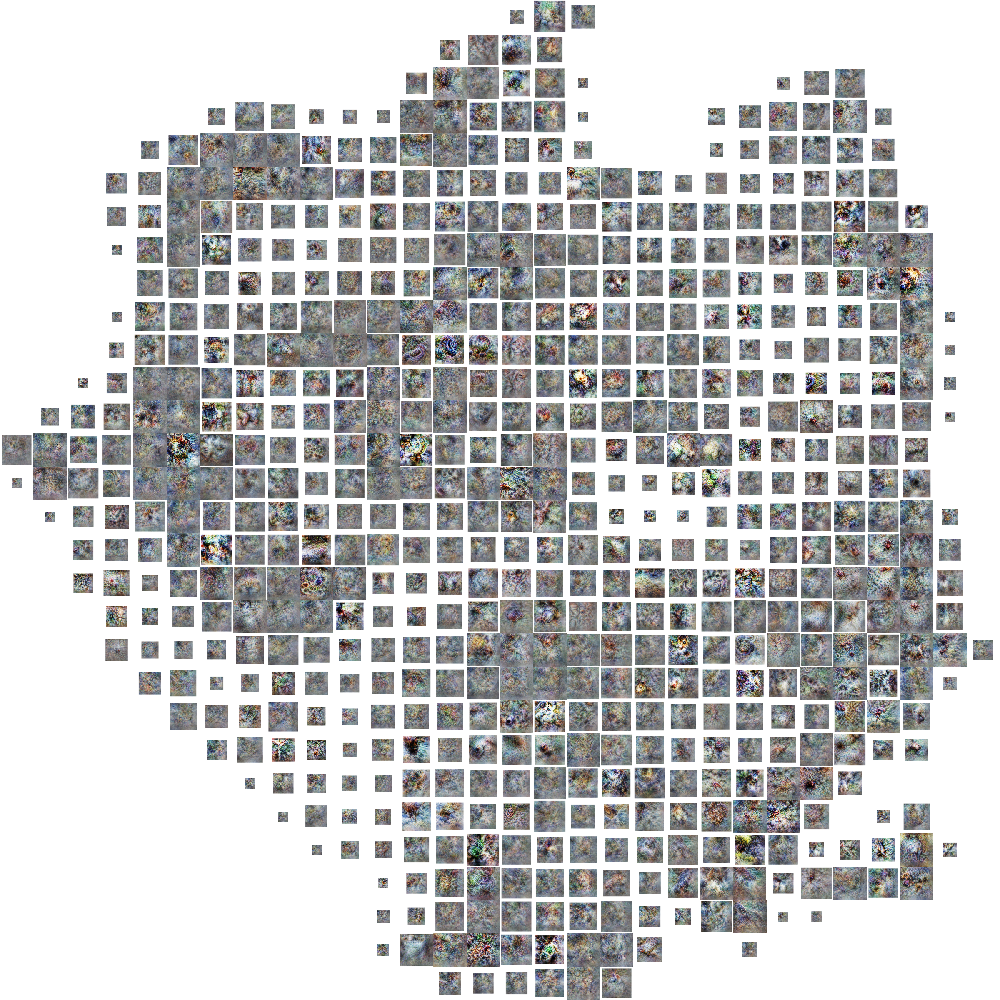

In [27]:
from PIL import Image
img = Image.fromarray((255.*canvas).astype(np.uint8))
img.show()
img.save("atlas_class_medium-large_non_shap_new_new_new.png")

In [34]:
from PIL import Image
import numpy as np

# target_image = "atlas_class_medium-large_shap.png"
target_image = "atlas_class_medium-large_non_shap_new_new_new.png" #"atlas_class_medium-large_shap.png" #"atlas_class_medium-large_non_shap_new_new_new.png" #
target_dest = ".".join([*target_image.split(".")[:-1], "new", "png"]) 
img_inp = np.asarray(Image.open(target_image))

In [35]:
r_check = img_inp[...,0]==255
b_check = img_inp[...,1]==255
g_check = img_inp[...,2]==255
mask = np.logical_and(r_check, np.logical_and(g_check, b_check))
alpha = (255*(1 - mask.astype(np.int32))).astype(np.uint8)
rgba_img = np.concatenate([img_inp, alpha[..., None]], axis=-1)

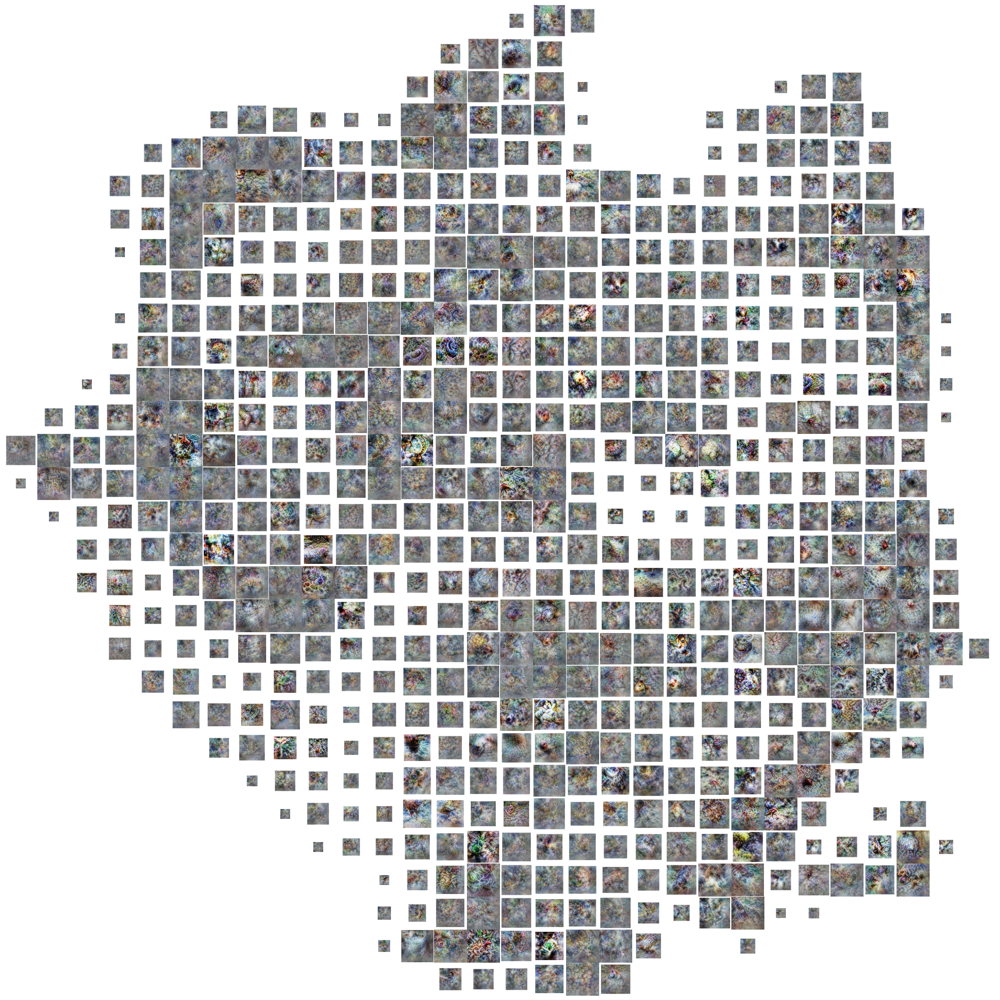

In [36]:
from matplotlib import pyplot as plt

plt.figure(figsize=(30, 30))
plt.imshow(rgba_img)
plt.axis('off')

plt.savefig(target_dest, bbox_inches='tight', transparent=True)


In [9]:
rgba_img.shape

(2400, 2400, 4)

In [ ]:
r_check = canvas[...,0]==1.
g_check = canvas[...,1]==1.
b_check = canvas[...,2]==1.

mask = np.logical_and(r_check, np.logical_and(g_check, b_check))
alpha = 1. - mask
rgba_canvas = np.concat(canvas, alpha, -1)
plt.imshow()

In [ ]:
from copy import deepcopy
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = models.inceptionv1(pretrained=True)
model = model.to(device)
model.eval()
model_pert = deepcopy(model)


In [ ]:
for w in model_pert.parameters():
    with torch.no_grad():
        w.add_((2*torch.rand_like(w)) - 1)

In [ ]:
for w1, w2 in zip(model_pert.parameters(), model.parameters()):
    assert not torch.allclose(w1,w2)

In [ ]:
from scipy.ndimage import zoom
def border_resize(img, ratio):
    og_shape = img.shape
    new_shape = og_shape / np.sqrt(ratio)
    new_shape = [int(n) for n in new_shape]
    new_shape[2] = 3
    blank = np.ones(new_shape)
    off_ratio = ((1./np.sqrt(ratio)) - 1.) / 2.
    offx, offy = int(off_ratio*og_shape[0]), int(off_ratio*og_shape[1])
    
    offx_end, offy_end = offx+og_shape[0] , offy+og_shape[1]
    blank[ offx:offx_end, offy:offy_end, : ] = img
    final = np.stack([zoom(blank[:,:,c], np.sqrt(ratio), order=3) for c in range(3)], axis=-1)

    return final


In [ ]:
imgs[0][0].shape

(128, 128, 3)

In [ ]:
check_img = border_resize(imgs[0][0], 0.75**2)

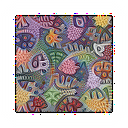

In [ ]:
from PIL import Image
img = Image.fromarray((255.*check_img).astype(np.uint8))
img.show()

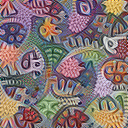

In [ ]:
from PIL import Image
img = Image.fromarray((255.*imgs[0][0]).astype(np.uint8))
img.show()